# 1)  Hocanın Kısmı

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv("data/29-country_data.csv")
df.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167 entries, 0 to 166
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   country     167 non-null    object 
 1   child_mort  167 non-null    float64
 2   exports     167 non-null    float64
 3   health      167 non-null    float64
 4   imports     167 non-null    float64
 5   income      167 non-null    int64  
 6   inflation   167 non-null    float64
 7   life_expec  167 non-null    float64
 8   total_fer   167 non-null    float64
 9   gdpp        167 non-null    int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 13.2+ KB


In [4]:
df.describe()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000
mean,38.270060,41.108976,6.815689,46.890215,17144.688623,7.781832,70.555689,2.947964,12964.155689
std,40.328931,27.412010,2.746837,24.209589,19278.067698,10.570704,8.893172,1.513848,18328.704809
min,2.600000,0.109000,1.810000,0.065900,609.000000,-4.210000,32.100000,1.150000,231.000000
25%,8.250000,23.800000,4.920000,30.200000,3355.000000,1.810000,65.300000,1.795000,1330.000000
50%,19.300000,35.000000,6.320000,43.300000,9960.000000,5.390000,73.100000,2.410000,4660.000000
75%,62.100000,51.350000,8.600000,58.750000,22800.000000,10.750000,76.800000,3.880000,14050.000000
max,208.000000,200.000000,17.900000,174.000000,125000.000000,104.000000,82.800000,7.490000,105000.000000


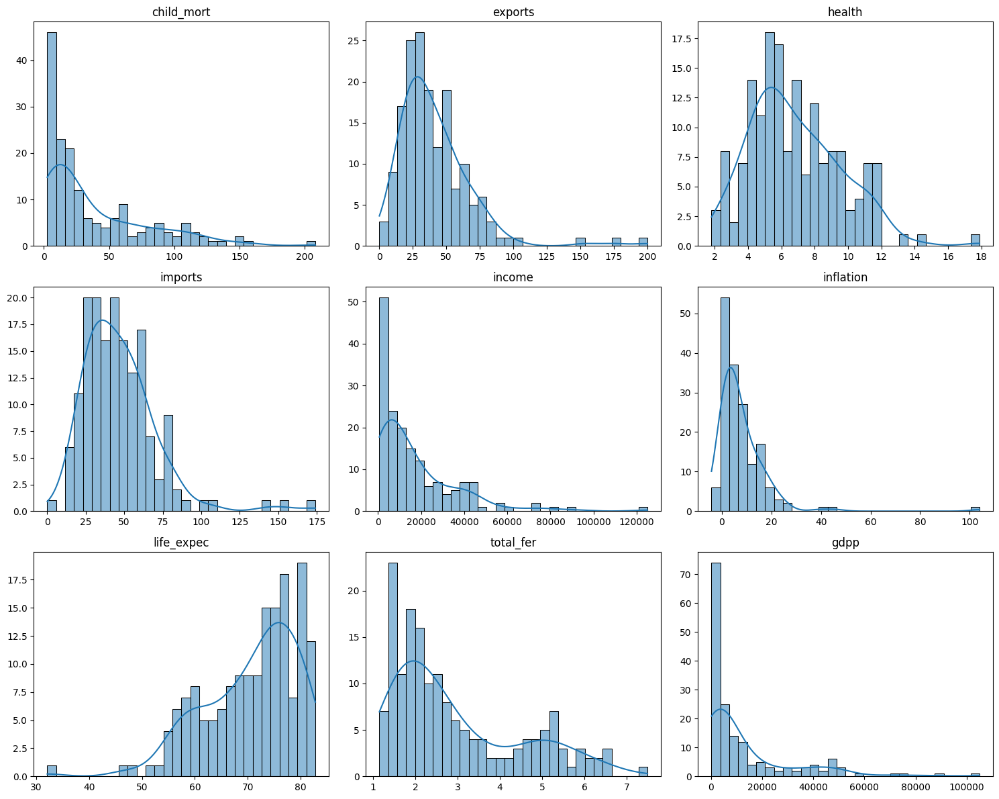

In [5]:
import math
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_all_histograms(df, title_prefix=""):
    num_cols = df.select_dtypes(include=[np.number]).columns
    n_cols = 3
    n_rows = math.ceil(len(num_cols) / n_cols)

    plt.figure(figsize=(5 * n_cols, 4 * n_rows))

    for i, col in enumerate(num_cols, 1):
        plt.subplot(n_rows, n_cols, i)
        sns.histplot(df[col], kde=True, bins=30)
        plt.title(f"{title_prefix}{col}")
        plt.xlabel("")
        plt.ylabel("")

    plt.tight_layout()
    plt.show()
plot_all_histograms(df)

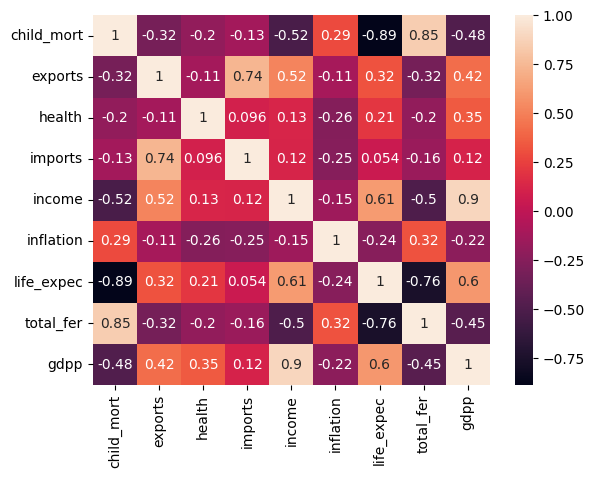

In [6]:
sns.heatmap(df.corr(numeric_only=True), annot=True)
plt.show()

In [7]:
df2 = df.drop("country", axis=1)
df2.head()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


In [8]:
df.columns

Index(['country', 'child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp'],
      dtype='object')

In [9]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df2= scaler.fit_transform(df2)
df2 = pd.DataFrame(df2, columns = ['child_mort', 'exports', 'health', 'imports', 'income','inflation', 'life_expec', 'total_fer', 'gdpp'])

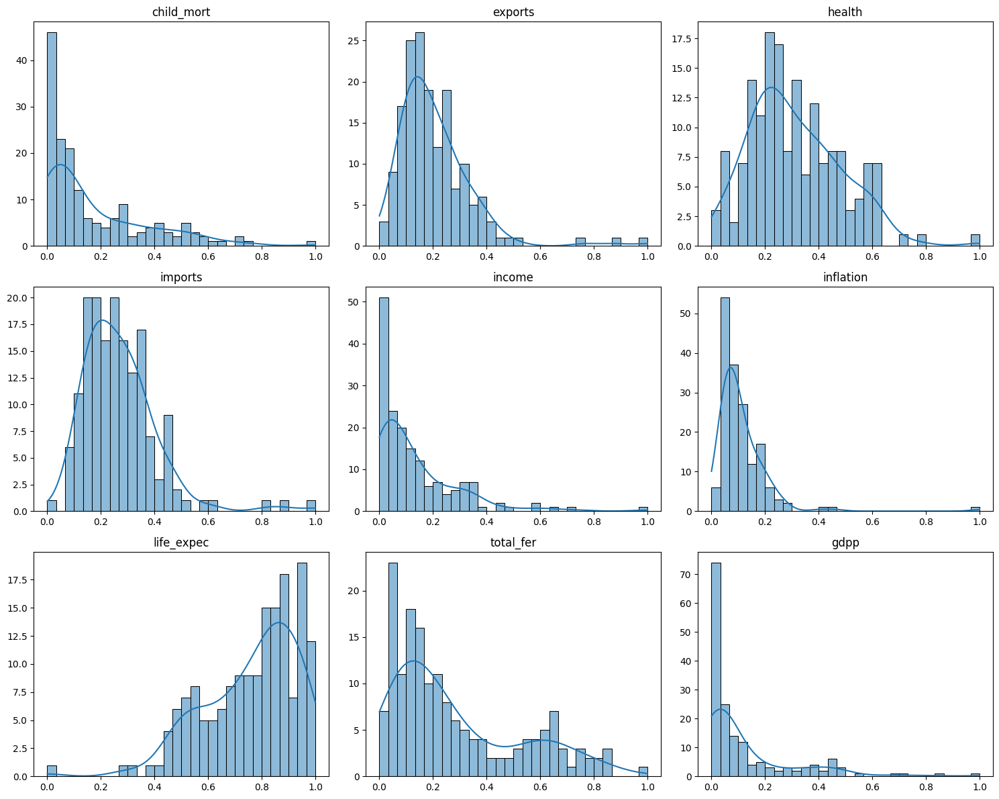

In [10]:
plot_all_histograms(df2)

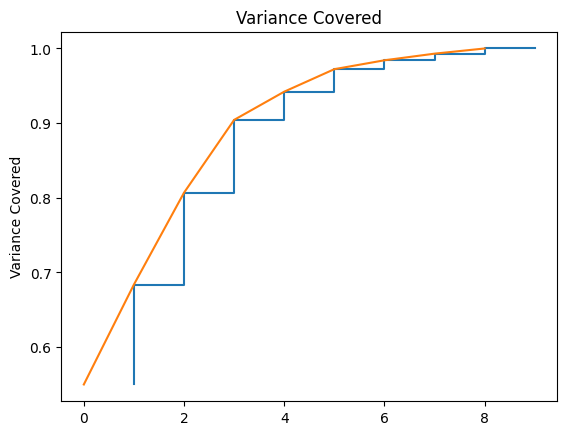

In [11]:
from sklearn.decomposition import PCA
pca = PCA()
pca_df2 = pd.DataFrame(pca.fit_transform(df2))

plt.step(list(range(1,10)), np.cumsum(pca.explained_variance_ratio_))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.ylabel("Variance Covered")
plt.title("Variance Covered")
plt.show()

In [12]:
pca_df2 = pca_df2.drop(columns = [3,4,5,6,7,8])
pca_df2

,0,1,2
0,0.599078,0.095490,0.157554
1,-0.158474,-0.212092,-0.064189
2,-0.003686,-0.135867,-0.134182
3,0.650235,0.275975,-0.142672
4,-0.200711,-0.064662,-0.100715
...,...,...,...
162,0.160078,-0.029625,-0.121910
163,-0.061133,-0.171339,-0.058586
164,-0.115512,-0.032034,-0.195243
165,0.332968,-0.019824,-0.029989


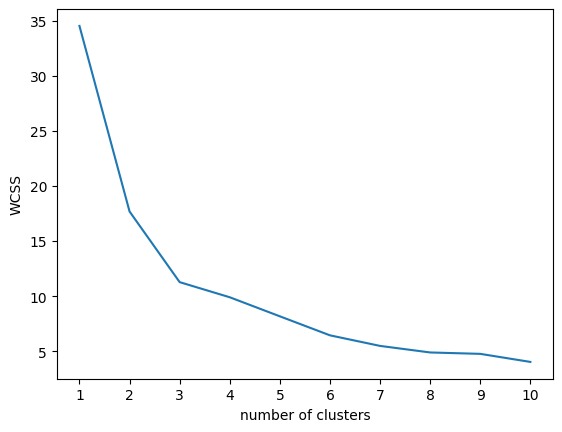

In [13]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(pca_df2)
    wcss.append(kmeans.inertia_)

plt.plot(range(1,11), wcss)
plt.xticks(range(1,11))
plt.xlabel("number of clusters")
plt.ylabel("WCSS")
plt.show()

In [14]:
model=KMeans(n_clusters=3)
model.fit(pca_df2)

labels=model.labels_
silhouette_score(pca_df2, labels)

0.43863203452366817

In [15]:
df["Class"] = labels
df.sample(10)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Class
22,Brazil,19.8,10.7,9.01,11.8,14500,8.410,74.2,1.80,11200,2
149,Timor-Leste,62.6,2.2,9.12,27.8,1850,26.500,71.1,6.23,3600,0
76,Jamaica,18.1,31.3,4.81,49.6,8000,9.810,74.7,2.17,4680,2
144,Sweden,3.0,46.2,9.63,40.7,42900,0.991,81.5,1.98,52100,1
17,Benin,111.0,23.8,4.10,37.2,1820,0.885,61.8,5.36,758,0
115,Oman,11.7,65.7,2.77,41.2,45300,15.600,76.1,2.90,19300,2
100,Mauritius,15.0,51.2,6.00,62.2,15900,1.130,73.4,1.57,8000,2
23,Brunei,10.5,67.4,2.84,28.0,80600,16.700,77.1,1.84,35300,1
15,Belgium,4.5,76.4,10.70,74.7,41100,1.880,80.0,1.86,44400,1
134,Slovak Republic,7.0,76.3,8.79,77.8,25200,0.485,75.5,1.43,16600,1


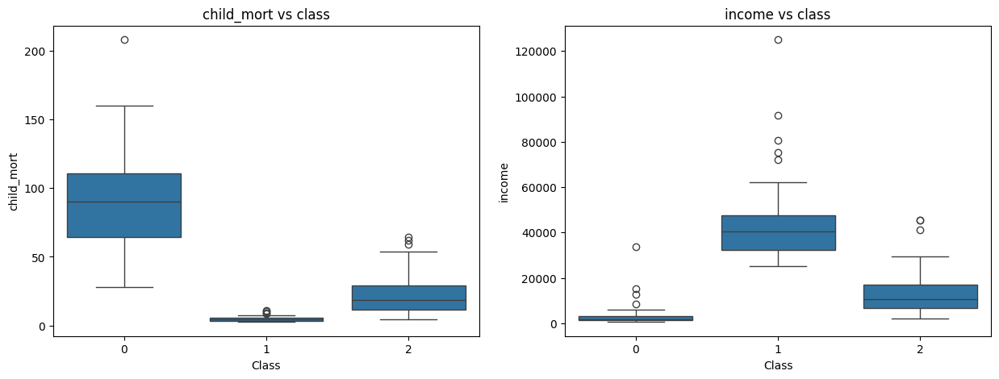

In [16]:
fig, ax = plt.subplots(nrows= 1, ncols=2, figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(data=df, x="Class", y="child_mort")
plt.title("child_mort vs class")
plt.subplot(1,2,2)
sns.boxplot(data=df, x="Class", y="income")
plt.title("income vs class")
plt.show()

In [18]:
# 2 -> in between
# 0 -> budget needed
# 1 -> no budget needed

import plotly.express as px
pca_df2.insert(0, column= "Country", value = df['country'])
pca_df2 ['Class'] = labels
pca_df2. loc [pca_df2 ['Class'] == 0, 'Class'] = "Budget Needed"
pca_df2. loc [pca_df2 ['Class'] == 2, 'Class'] = "In Between"
pca_df2.loc [pca_df2 ['Class'] == 1, 'Class'] = "No Budget Needed"

C:\Users\Batuhan\AppData\Local\Temp\ipykernel_18276\3029375889.py:8: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Budget Needed' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  pca_df2. loc [pca_df2 ['Class'] == 0, 'Class'] = "Budget Needed"


In [19]:
pca_df2

,Country,0,1,2,Class
0,Afghanistan,0.599078,0.095490,0.157554,Budget Needed
1,Albania,-0.158474,-0.212092,-0.064189,In Between
2,Algeria,-0.003686,-0.135867,-0.134182,In Between
3,Angola,0.650235,0.275975,-0.142672,Budget Needed
4,Antigua and Barbuda,-0.200711,-0.064662,-0.100715,In Between
...,...,...,...,...,...
162,Vanuatu,0.160078,-0.029625,-0.121910,In Between
163,Venezuela,-0.061133,-0.171339,-0.058586,In Between
164,Vietnam,-0.115512,-0.032034,-0.195243,In Between
165,Yemen,0.332968,-0.019824,-0.029989,Budget Needed


In [20]:
import plotly.express as px

fig = px.choropleth(
    pca_df2[['Country', 'Class']],
    locationmode="country names",
    locations="Country",
    title="Needed Budget by Country",
    color=pca_df2['Class'],
    color_discrete_map={
        "Budget Needed": "Red",
        "In Between": "Yellow",
        "No Budget Needed": "Green"
    }
)

fig.update_geos(fitbounds="locations", visible=True)
fig.show()


# 2) Benim Kısım

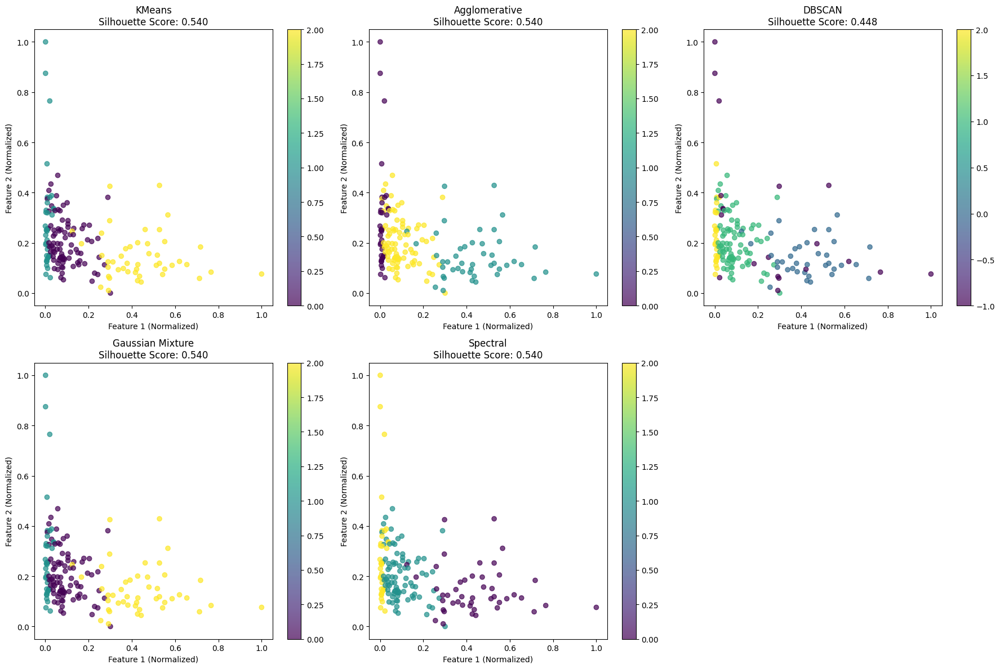

Silhouette Skorları:
KMeans: 0.540
Agglomerative: 0.540
Gaussian Mixture: 0.540
Spectral: 0.540
DBSCAN: 0.448

En iyi algoritma: KMeans

KMeans Cluster Analizi:

Cluster 0 (86 ülke):
Örnek ülkeler: Albania, Algeria, Antigua and Barbuda
  child_mort: 22.4
  income: 12770.8
  life_expec: 72.6
  gdpp: 6719.8

Cluster 1 (35 ülke):
Örnek ülkeler: Australia, Austria, Belgium
  child_mort: 4.9
  income: 45802.9
  life_expec: 80.2
  gdpp: 43117.1

Cluster 2 (46 ülke):
Örnek ülkeler: Afghanistan, Angola, Benin
  child_mort: 93.3
  income: 3516.8
  life_expec: 59.4
  gdpp: 1695.9


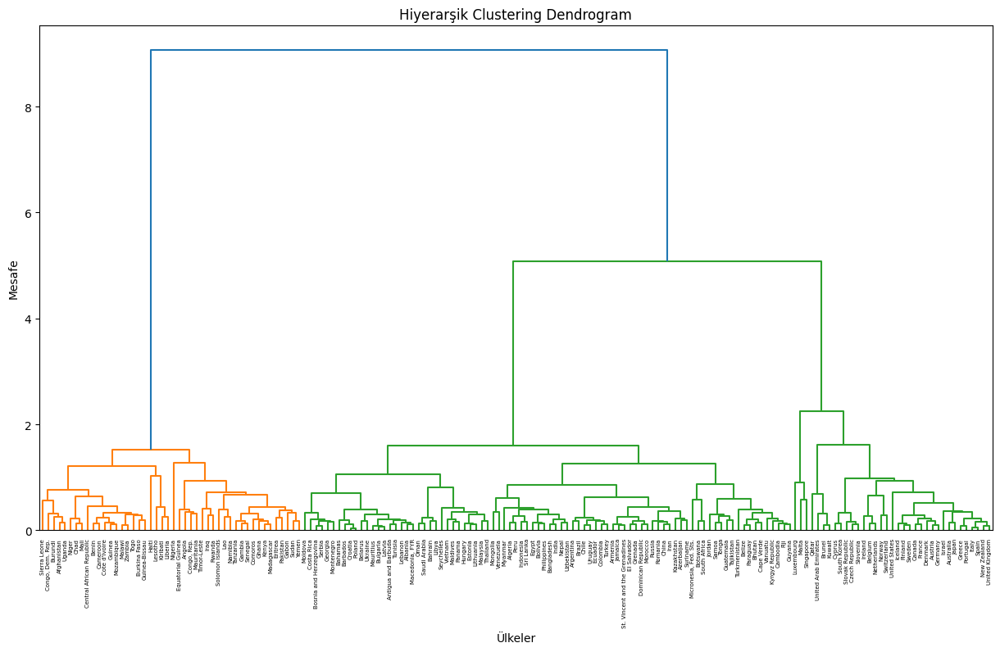

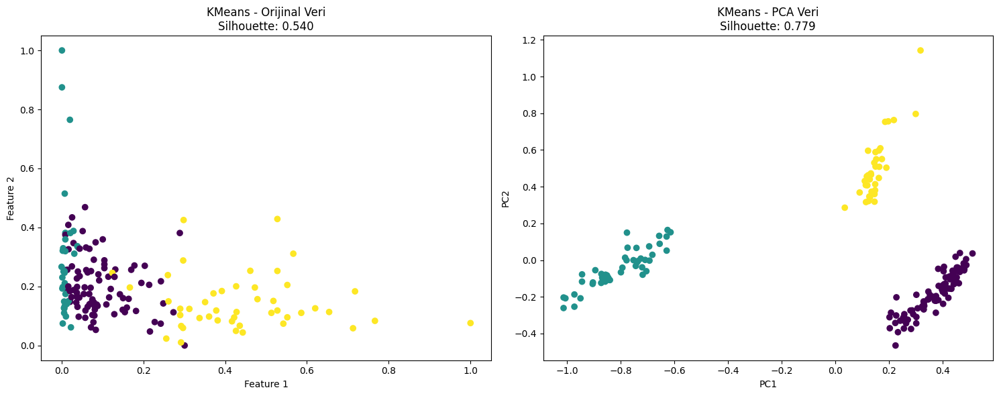


PCA Karşılaştırması:
Orijinal veri silhouette score: 0.540
PCA veri silhouette score: 0.779


In [21]:
# Diğer unsupervised learning algoritmalarını deneme
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, adjusted_rand_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Orijinal veri ile PCA'sız çalışma
df_numeric = df.select_dtypes(include=[np.number]).dropna()

# MinMaxScaler ile normalize etme
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df_numeric)

# Farklı algoritmaları deneme
algorithms = {
    'KMeans': KMeans(n_clusters=3, random_state=42),
    'Agglomerative': AgglomerativeClustering(n_clusters=3),
    'DBSCAN': DBSCAN(eps=0.3, min_samples=5),
    'Gaussian Mixture': GaussianMixture(n_components=3, random_state=42),
    'Spectral': SpectralClustering(n_clusters=3, random_state=42)
}

# Sonuçları kaydetme
results = {}
silhouette_scores = {}

# Her algoritma için clustering
for name, algorithm in algorithms.items():
    labels = algorithm.fit_predict(df_scaled)
    results[name] = labels
    
    # Silhouette score hesaplama (DBSCAN için özel kontrol)
    if len(set(labels)) > 1:  # En az 2 cluster olmalı
        silhouette_scores[name] = silhouette_score(df_scaled, labels)
    else:
        silhouette_scores[name] = -1  # Geçersiz

# Sonuçları görselleştirme
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.ravel()

for i, (name, labels) in enumerate(results.items()):
    ax = axes[i]
    
    # İlk iki feature ile scatter plot
    scatter = ax.scatter(df_scaled[:, 0], df_scaled[:, 1], c=labels, cmap='viridis', alpha=0.7)
    ax.set_title(f'{name}\nSilhouette Score: {silhouette_scores[name]:.3f}')
    ax.set_xlabel('Feature 1 (Normalized)')
    ax.set_ylabel('Feature 2 (Normalized)')
    plt.colorbar(scatter, ax=ax)

# Boş subplot'u kaldır
fig.delaxes(axes[5])

plt.tight_layout()
plt.show()

# Silhouette skorlarını karşılaştırma
print("Silhouette Skorları:")
for name, score in sorted(silhouette_scores.items(), key=lambda x: x[1], reverse=True):
    print(f"{name}: {score:.3f}")

# En iyi algoritma ile detaylı analiz
best_algorithm = max(silhouette_scores, key=silhouette_scores.get)
best_labels = results[best_algorithm]

print(f"\nEn iyi algoritma: {best_algorithm}")

# En iyi algoritma ile ülke sınıflandırması
df_with_clusters = df.copy()
df_with_clusters['Cluster'] = best_labels

# Cluster özelliklerini analiz etme
print(f"\n{best_algorithm} Cluster Analizi:")
for cluster in sorted(df_with_clusters['Cluster'].unique()):
    cluster_data = df_with_clusters[df_with_clusters['Cluster'] == cluster]
    print(f"\nCluster {cluster} ({len(cluster_data)} ülke):")
    print("Örnek ülkeler:", ", ".join(cluster_data['country'].head(3).values))
    
    # Cluster istatistikleri
    numeric_cols = ['child_mort', 'income', 'life_expec', 'gdpp']
    for col in numeric_cols:
        mean_val = cluster_data[col].mean()
        print(f"  {col}: {mean_val:.1f}")

# Hiyerarşik clustering dendrogram
from scipy.cluster.hierarchy import dendrogram, linkage

plt.figure(figsize=(15, 8))
linkage_matrix = linkage(df_scaled, method='ward')
dendrogram(linkage_matrix, labels=df['country'].values, leaf_rotation=90)
plt.title('Hiyerarşik Clustering Dendrogram')
plt.xlabel('Ülkeler')
plt.ylabel('Mesafe')
plt.show()

# PCA ile karşılaştırma için basit analiz
from sklearn.decomposition import PCA

# PCA ile boyut indirgeme
pca = PCA(n_components=2)
pca_data = pca.fit_transform(df_scaled)

# KMeans ile PCA'lı ve PCA'sız karşılaştırma
kmeans_original = KMeans(n_clusters=3, random_state=42).fit_predict(df_scaled)
kmeans_pca = KMeans(n_clusters=3, random_state=42).fit_predict(pca_data)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# PCA'sız sonuç
ax1.scatter(df_scaled[:, 0], df_scaled[:, 1], c=kmeans_original, cmap='viridis')
ax1.set_title(f'KMeans - Orijinal Veri\nSilhouette: {silhouette_score(df_scaled, kmeans_original):.3f}')
ax1.set_xlabel('Feature 1')
ax1.set_ylabel('Feature 2')

# PCA'lı sonuç
ax2.scatter(pca_data[:, 0], pca_data[:, 1], c=kmeans_pca, cmap='viridis')
ax2.set_title(f'KMeans - PCA Veri\nSilhouette: {silhouette_score(pca_data, kmeans_pca):.3f}')
ax2.set_xlabel('PC1')
ax2.set_ylabel('PC2')

plt.tight_layout()
plt.show()

print(f"\nPCA Karşılaştırması:")
print(f"Orijinal veri silhouette score: {silhouette_score(df_scaled, kmeans_original):.3f}")
print(f"PCA veri silhouette score: {silhouette_score(pca_data, kmeans_pca):.3f}")